# 🚗 Practice: Automatic License Plate Recognition

## 🎯 Objective

The objective of this exercise is to design and develop a system capable of automatically recognizing the **digits of vehicle license plates** present in the images from the `camara_parking` dataset.

Your challenge is to build a **model or model pipeline** that takes an image as input and returns the corresponding license plate number as output.

## 🔧 Expected Output

By the end of this exercise, you should have implemented the following function:

```
reconocer_matricula(imagen: np.ndarray) -> str
```

This function will receive an image of a car and return a string with the recognized license plate number. The main goal is to **correctly recognize as many license plates as possible**.

## 🗂️ 1. Download and Exploration of the Dataset

In this first section:

- Download the `camara_parking` dataset.
- Display visual examples of the images.
- Analyze potential challenges presented by the dataset: resolution, lighting conditions, occlusions, variety of license plates, etc.

In [ ]:
import os

os.environ["KAGGLE_USERNAME"] = ""  # Enter your Kaggle username
os.environ["KAGGLE_KEY"] = ""       # Enter your Kaggle API key

In [ ]:
!kaggle datasets download -d andrewmvd/car-plate-detection
!unzip -q car-plate-detection.zip -d car_plate_dataset

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/car-plate-detection
License(s): CC0-1.0


Visualization of some sample images from the dataset

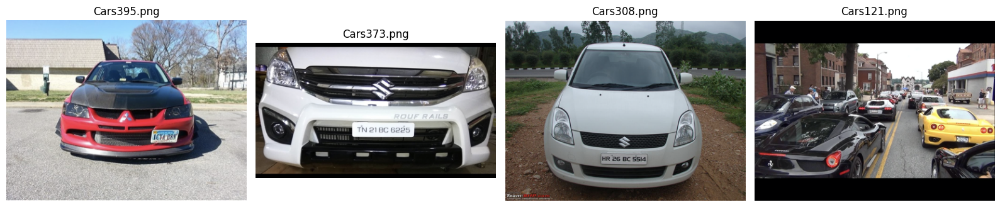

In [ ]:
# Visualization of license plate dataset images

import matplotlib.pyplot as plt
import cv2
from pathlib import Path

# Path to the .png images
image_dir = Path("/content/car_plate_dataset/images")

# Take the first 4 .png images
image_paths = list(image_dir.glob("*.png"))[:4]

# Display images
fig, axes = plt.subplots(1, len(image_paths), figsize=(16, 4))
for ax, path in zip(axes, image_paths):
    img = cv2.imread(str(path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_title(path.name)
    ax.axis("off")
plt.tight_layout()
plt.show()

## 📊 2. Data Preparation


Convert the labels to the correct format (convert XML to TXT)

In [ ]:
import xml.etree.ElementTree as ET

# Input and output directories
annotations_dir = "/content/car_plate_dataset/annotations"  # Folder with .xml files (Pascal VOC format)
labels_dir = "/content/car_plate_dataset/labels"  # Destination folder to save .txt files in YOLO format

# Create the output folder if it doesn't exist
os.makedirs(labels_dir, exist_ok=True)

# Name of the class to search for in the XML files
class_name = "licence"  # Make sure it matches the label used in the XML annotations

# Iterate through all XML files in the directory
for filename in os.listdir(annotations_dir):
    if not filename.endswith(".xml"):
        continue  # Skip non-XML files

    xml_path = os.path.join(annotations_dir, filename)
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Get image dimensions
    image_width = int(root.find("size/width").text)
    image_height = int(root.find("size/height").text)

    yolo_lines = []  # List of lines in YOLO format

    # Look for each labeled object
    for obj in root.findall("object"):
        name = obj.find("name").text.strip().lower()

        if name != class_name:
            continue  # Skip other classes if any

        # Bounding box coordinates in Pascal VOC format
        bndbox = obj.find("bndbox")
        xmin = int(bndbox.find("xmin").text)
        ymin = int(bndbox.find("ymin").text)
        xmax = int(bndbox.find("xmax").text)
        ymax = int(bndbox.find("ymax").text)

        # Convert coordinates to YOLO format (normalized values)
        x_center = (xmin + xmax) / 2.0 / image_width
        y_center = (ymin + ymax) / 2.0 / image_height
        width = (xmax - xmin) / image_width
        height = (ymax - ymin) / image_height

        # Add the line in YOLO format (class 0 since there is only one class)
        yolo_lines.append(f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

    # Save the .txt file only if there are labeled objects
    if yolo_lines:
        txt_filename = filename.replace(".xml", ".txt")
        txt_path = os.path.join(labels_dir, txt_filename)
        with open(txt_path, "w") as f:
            f.write("\n".join(yolo_lines))

print("✅ Conversion completed. YOLO files are ready.")

✅ Conversión completada. Archivos YOLO listos.


Augmented images

In [ ]:
from albumentations import Compose, RandomBrightnessContrast, Blur, Rotate, HorizontalFlip
from pathlib import Path
import numpy as np

# Original path for images and labels (YOLO format)
image_dir = Path("/content/car_plate_dataset/images")
label_dir = Path("/content/car_plate_dataset/labels")

# Output path where augmented images and labels will be saved
augmented_dir = Path("/content/car_plate_dataset/augmented")
augmented_dir.mkdir(exist_ok=True)

# Definition of data augmentation transformations
transform = Compose([
    RandomBrightnessContrast(p=0.5),   # Random changes in brightness and contrast
    Blur(blur_limit=3, p=0.3),         # Blurring with a maximum kernel size of 3
    Rotate(limit=10, p=0.5),           # Random rotation within ±10 degrees
    HorizontalFlip(p=0.3)              # Horizontal flip with 30% probability
], bbox_params={'format': 'yolo', 'label_fields': ['class_labels']})

# Apply augmentations to each image in the dataset
for img_path in image_dir.glob("*.png"):
    label_path = label_dir / (img_path.stem + ".txt")

    # Verify that the corresponding label file exists
    if not label_path.exists():
        continue

    # Load the image
    image = cv2.imread(str(img_path))
    height, width = image.shape[:2]

    # Read YOLO format labels
    with open(label_path, "r") as f:
        lines = f.readlines()

    bboxes = []
    class_labels = []

    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x, y, w, h = map(float, parts[1:])
        bboxes.append([x, y, w, h])
        class_labels.append(class_id)

    # Apply the defined transformations
    augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
    aug_img = augmented["image"]
    aug_bboxes = augmented["bboxes"]

    # Save the augmented image
    out_img_path = augmented_dir / f"{img_path.stem}_aug.png"
    cv2.imwrite(str(out_img_path), aug_img)

    # Save the YOLO labels for the augmented image
    out_label_path = augmented_dir / f"{img_path.stem}_aug.txt"
    with open(out_label_path, "w") as f:
        for label, (x, y, w, h) in zip(class_labels, aug_bboxes):
            f.write(f"{label} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")


Split into train, validation, and test sets

In [ ]:
import shutil
from sklearn.model_selection import train_test_split

# Base path definitions
base_path = Path("/content/car_plate_dataset")
images_path = base_path / "images"          # Original images
labels_path = base_path / "labels"          # Corresponding YOLO labels
augmented_path = base_path / "augmented"    # Augmented images and labels

# Combine original and augmented images into a single list
all_images = list(images_path.glob("*.png")) + list(augmented_path.glob("*.png"))
all_images = sorted(all_images)  # Sort by name for consistency

# Dataset split: 80% training, 10% validation, 10% testing
train_files, temp_files = train_test_split(all_images, test_size=0.2, random_state=42)
val_files, test_files = train_test_split(temp_files, test_size=0.5, random_state=42)

# Dictionary that stores each dataset split with its corresponding files
splits = {
    "train": train_files,
    "val": val_files,
    "test": test_files
}

# Create necessary folders for each split and type (images and labels)
for split in splits:
    for subfolder in ["images", "labels"]:
        dest = base_path / split / subfolder
        dest.mkdir(parents=True, exist_ok=True)

# Copy images and corresponding labels to their respective folders
for split, files in splits.items():
    for img_file in files:
        # Copy the image
        dest_img = base_path / split / "images" / img_file.name
        shutil.copy(img_file, dest_img)

        # Determine the path of the associated label
        if "augmented" in str(img_file):
            label_file = augmented_path / (img_file.stem + ".txt")
        else:
            label_file = labels_path / (img_file.stem + ".txt")

        # Copy the label if it exists
        if label_file.exists():
            dest_label = base_path / split / "labels" / label_file.name
            shutil.copy(label_file, dest_label)


Create the data.yaml file

In [ ]:
# Define the contents of the data.yaml file for training the YOLO model
data_yaml = """
train: /content/car_plate_dataset/train
val: /content/car_plate_dataset/val
test: /content/car_plate_dataset/test

nc: 1  # Number of classes
names: ['license plate']  # Name(s) of the class(es)
"""

# Save the file at the specified path
with open('/content/car_plate_dataset/data.yaml', 'w') as f:
    f.write(data_yaml)

print("data.yaml file successfully created at /content/car_plate_dataset/data.yaml")

✅ Archivo data.yaml creado correctamente en /content/car_plate_dataset/data.yaml


## 🧪 3. Model Training

A YOLOv8s model is used to detect where the license plates are located in the image.

Once the license plate is located, the image is cropped to include only the plate.

A perspective correction is applied to center and align the license plate.

A PaddleOCR model is then used for text recognition.

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 102.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

We train the YOLO model to learn how to detect vehicle license plates.

In [ ]:
from ultralytics import YOLO

# Create the model from the YOLOv8 small configuration file
model = YOLO("yolov8s.yaml")  # You can also use "yolov8s.pt" for fine-tuning from a pre-trained model

# Train the model with the specified parameters
model.train(
    data="/content/car_plate_dataset/data.yaml",  # Path to the dataset configuration file
    epochs=50,                # Total number of epochs
    imgsz=640,                # Input image size
    batch=8,                  # Batch size
    name="matriculas_v2",     # Experiment name (creates a folder with this name in runs/detect)
    patience=10,              # Number of epochs with no improvement before early stopping
    device="cuda",            # Train on GPU ("cpu" if no GPU is available)
    augment=True,             # Apply built-in YOLOv8 data augmentations
    verbose=True              # Show detailed training output
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.123 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/car_plate_dataset/data.yaml, epochs=50, time=None, patience=10, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=matriculas_v2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=

100%|██████████| 755k/755k [00:00<00:00, 13.8MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

 19                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1   1969152  ultralytics.nn.modules.block.C2f             [768, 512, 1]                 
 22        [15, 18, 21]  1   2116435  ultralytics.nn.modules.head.Detect           [1, [128, 256, 512]]          
YOLOv8s summary: 129 layers, 11,135,987 parameters, 11,135,971 gradients, 28.6 GFLOPs

Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 65.4MB/s]


We apply PaddleOCR to read the license plate text once YOLO has detected its location in the image.

In [ ]:
!pip install paddleocr paddlepaddle --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 37.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.8/192.8 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.8/297.8 kB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 969.6/969.6 kB 66.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 107.8 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=40d159498e6e0e1b2049c39521f16b5cd637af469b94942c6c0e19cd427a4cba
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24b609dfb8a89
Successfully built fire
  Attempting uninstall: opt_einsum
    Found 

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from paddleocr import PaddleOCR

# Load YOLO model (previously trained)
modelo_yolo = model  # Use the previously defined model

# Load PaddleOCR model (with angle detection, in English)
ocr_paddle = PaddleOCR(use_angle_cls=True, lang='en')

def unir_caracteres_ocr_paddle(resultados, umbral_distancia=50, umbral_altura=15):
    """
    Joins characters detected by PaddleOCR based on horizontal distance
    and height difference to form coherent lines of text.
    """
    if not resultados:
        return ""

    # Sort by the X coordinate of the first point in the bounding box
    resultados_ordenados = sorted(resultados, key=lambda r: r[0][0][0])
    final_text = ""
    previous_bbox = None

    for bbox, (text, prob) in resultados_ordenados:
        x = bbox[0][0]
        y = bbox[0][1]

        if previous_bbox:
            _, y_prev, _, _, x_prev_end = previous_bbox
            distance = x - x_prev_end
            height_diff = abs(y - y_prev)

            # If distance is small and height is similar, consider it part of the same line
            if distance < umbral_distancia and height_diff < umbral_altura:
                final_text += text
            else:
                final_text += " " + text
        else:
            final_text += text

        # Update reference to the previous bounding box
        previous_bbox = (x, y, bbox[1][0], bbox[1][1], bbox[2][0])

    return final_text.strip()

def corregir_perspectiva(imagen, box):
    """
    Applies perspective correction to the region of the image defined by a rectangular bounding box.
    """
    x1, y1, x2, y2 = box
    width = x2 - x1
    height = y2 - y1

    # Define source and destination points for the transformation
    src_points = np.float32([
        [x1, y1],
        [x2, y1],
        [x2, y2],
        [x1, y2]
    ])
    dst_points = np.float32([
        [0, 0],
        [width, 0],
        [width, height],
        [0, height]
    ])

    # Compute the transformation matrix and apply it
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    warp = cv2.warpPerspective(imagen, M, (width, height))

    return warp


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 3910/3910 [00:15<00:00, 254.74it/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10000/10000 [00:19<00:00, 514.22it/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2138/2138 [00:16<00:00, 131.38it/s]

[2025/05/01 22:15:27] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_l

## 🔍 4. Implementation of the `reconocer_matricula` Function

In [ ]:
def reconocer_matricula_inteligente(imagen: np.ndarray, mostrar: bool = True) -> str:
    """
    Detects a license plate in an image using YOLOv8 and recognizes the text with PaddleOCR.

    Parameters:
        imagen (np.ndarray): Image in BGR format (as returned by OpenCV).
        mostrar (bool): If True, displays the visual results using matplotlib.

    Returns:
        str: Detected license plate text, or "Not detected" if no plate is found.
    """
    # Run YOLO prediction
    resultados = modelo_yolo.predict(source=imagen, conf=0.4, verbose=False)

    # Check if any boxes were detected
    if resultados and len(resultados[0].boxes) > 0:
        boxes = resultados[0].boxes
        xyxy = boxes.xyxy.cpu().numpy().astype(int)  # Bounding box coordinates
        best_idx = np.argmax(boxes.conf.cpu().numpy())  # Take the highest-confidence detection
        x1, y1, x2, y2 = xyxy[best_idx]

        # Apply perspective correction to the detected region
        recorte = corregir_perspectiva(imagen, (x1, y1, x2, y2))
        recorte_ampliado = cv2.resize(recorte, (0, 0), fx=1.9, fy=1.9)  # Resize to improve OCR accuracy

        # Show the corrected crop if requested
        if mostrar:
            plt.figure(figsize=(4, 2))
            plt.imshow(cv2.cvtColor(recorte_ampliado, cv2.COLOR_BGR2RGB))
            plt.axis("off")
            plt.title("Corrected Crop (PaddleOCR)")
            plt.show()

        # Apply OCR with PaddleOCR
        resultados_ocr = ocr_paddle.ocr(recorte_ampliado, cls=True)

        if resultados_ocr and resultados_ocr[0]:
            texto_unido = unir_caracteres_ocr_paddle(resultados_ocr[0])
        else:
            texto_unido = ""

        # Display the original image with the detection and recognized text
        if mostrar:
            imagen_mostrar = imagen.copy()
            cv2.rectangle(imagen_mostrar, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(imagen_mostrar, texto_unido if texto_unido else "(no text)",
                        (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)
            plt.figure(figsize=(6, 4))
            plt.imshow(cv2.cvtColor(imagen_mostrar, cv2.COLOR_BGR2RGB))
            plt.axis("off")
            plt.title(f"Recognized Text: {texto_unido}")
            plt.show()

        return texto_unido

    # If no plate was detected
    return "Not detected"


def reconocer_matricula(imagen: np.ndarray) -> str:
    """
    Simplified version without visualization, ideal for batch evaluation.
    """
    return reconocer_matricula_inteligente(imagen, mostrar=False)

## 📈 5. Evaluation of Results and Metrics

To validate the effectiveness of the `reconocer_matricula_inteligente` system, a systematic evaluation was carried out on a set of test images simulating real captures from a parking camera.

### 5.1 Process Description

1. 📂 **Test set loading** from the path:  
`/content/car_plate_dataset/camara_parking/Custom Workflow Object Detection/test/images`

2. 🧠 For each image:
- The function `reconocer_matricula_inteligente(imagen)` is executed.
- The prediction is saved along with the file name.
- The image and prediction are displayed as visual support.

3. ✅ **Ground truth extraction** from the file name, which follows a pattern like:  
`A3731PA_EXIT_2024-08-05_10-16-27.jpg`

Using regular expressions, the license plate is extracted as ground truth.

4. 🧹 **Cleaning and comparison of results**:
- The prediction is normalized (uppercase and symbol-free).
- The prediction is compared against the ground truth.

5. 📊 **Metric calculation**:
- **Exact match**: percentage of times the prediction matches the real license plate 100%.
- **Character-level accuracy**: average number of correctly predicted characters over the total number of characters, even when there are partial errors.

### 5.2 Obtained Metrics

```text
✅ Exact matches: 86.96%
🧠 Average character accuracy: 93.48%

Unzip the folder containing the test images

In [ ]:
from zipfile import ZipFile
from pathlib import Path

# Path to the uploaded ZIP file
zip_path = Path("/content/Custom Workflow Object Detection.zip")
extract_path = Path("/content/car_plate_dataset/camara_parking")

# Extract the contents
with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

Make predictions

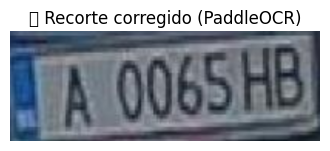

[2025/05/01 22:28:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.031006574630737305
[2025/05/01 22:28:58] ppocr DEBUG: cls num  : 1, elapsed : 0.008497238159179688
[2025/05/01 22:28:58] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05788731575012207


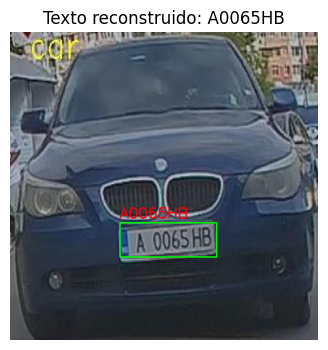

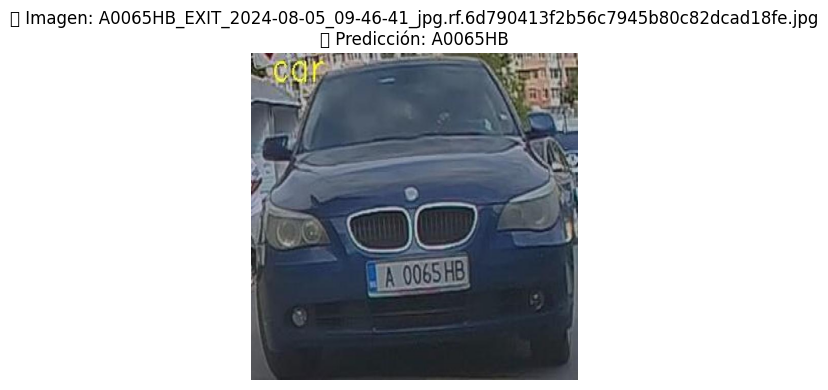

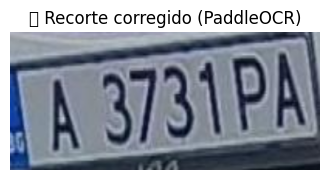

[2025/05/01 22:28:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.034789085388183594
[2025/05/01 22:28:58] ppocr DEBUG: cls num  : 1, elapsed : 0.011328458786010742
[2025/05/01 22:28:58] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05926871299743652


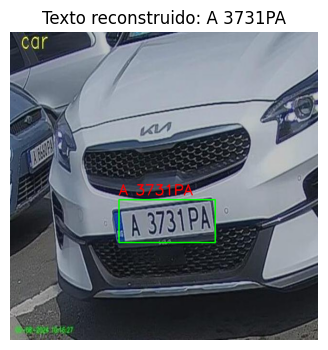

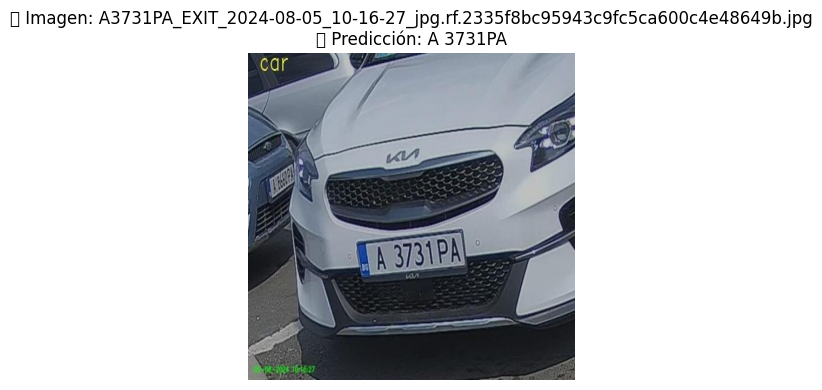

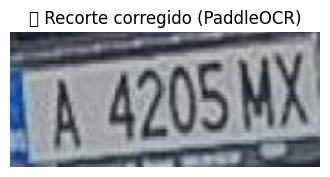

[2025/05/01 22:28:59] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.030881643295288086
[2025/05/01 22:28:59] ppocr DEBUG: cls num  : 1, elapsed : 0.010666370391845703
[2025/05/01 22:28:59] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06019878387451172


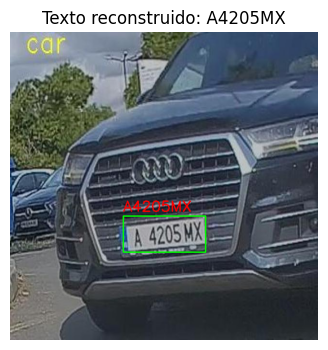

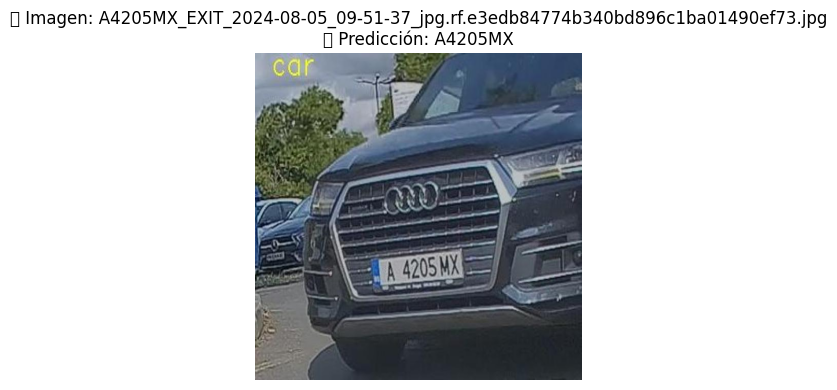

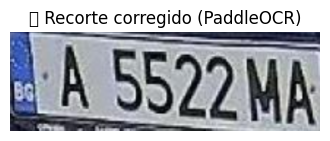

[2025/05/01 22:28:59] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.03821253776550293
[2025/05/01 22:28:59] ppocr DEBUG: cls num  : 2, elapsed : 0.017826318740844727
[2025/05/01 22:28:59] ppocr DEBUG: rec_res num  : 2, elapsed : 0.10886168479919434


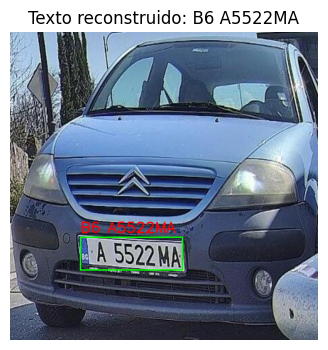

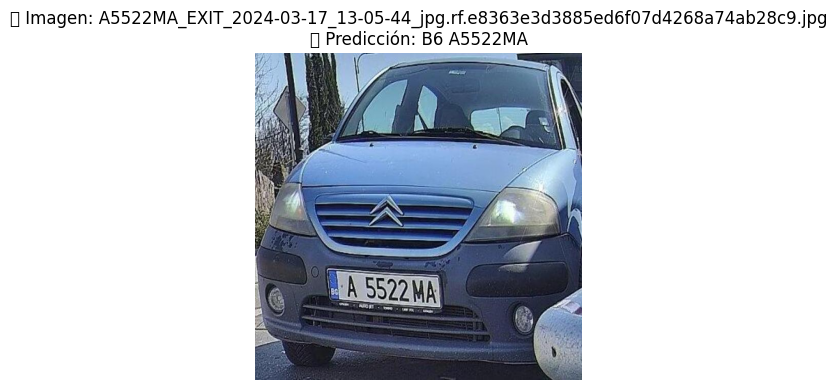

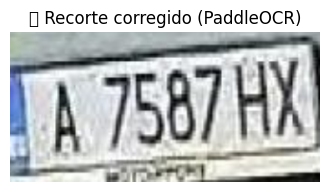

[2025/05/01 22:29:00] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.05099201202392578
[2025/05/01 22:29:00] ppocr DEBUG: cls num  : 1, elapsed : 0.010372638702392578
[2025/05/01 22:29:00] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0938408374786377


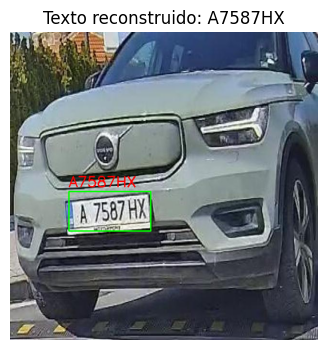

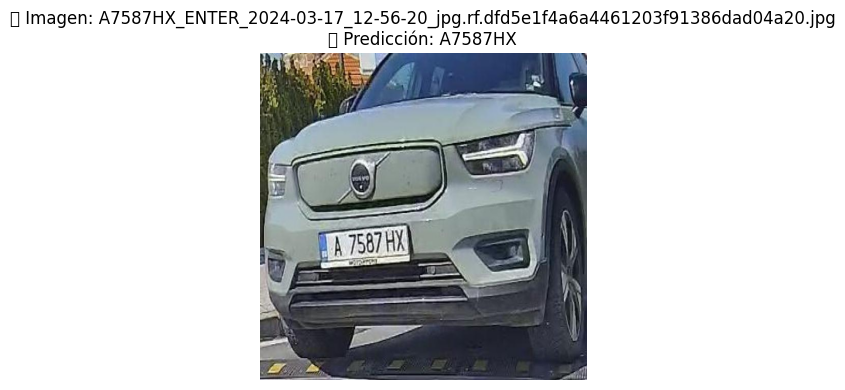

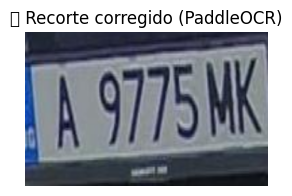

[2025/05/01 22:29:00] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.059232234954833984
[2025/05/01 22:29:00] ppocr DEBUG: cls num  : 1, elapsed : 0.01076197624206543
[2025/05/01 22:29:00] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07924556732177734


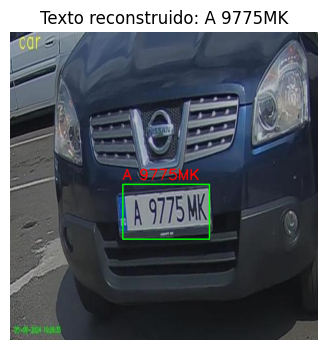

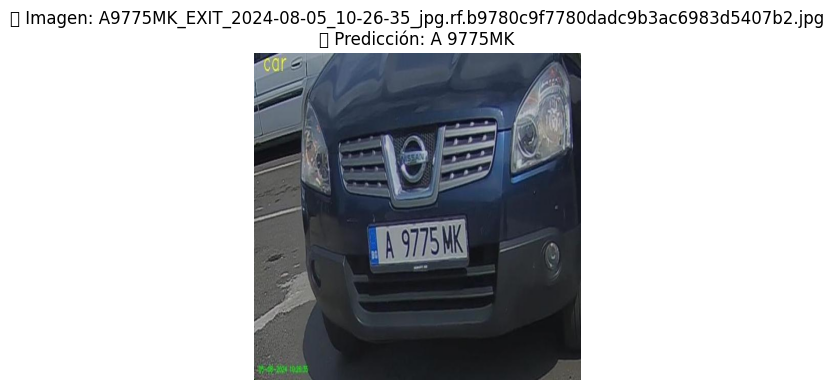

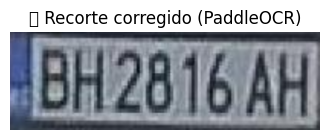

[2025/05/01 22:29:01] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04151773452758789
[2025/05/01 22:29:01] ppocr DEBUG: cls num  : 1, elapsed : 0.01667308807373047
[2025/05/01 22:29:01] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0811758041381836


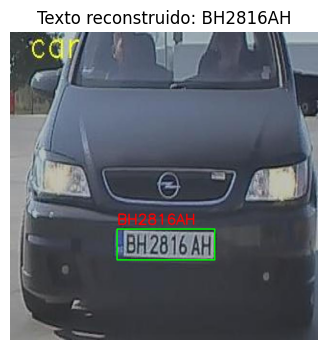

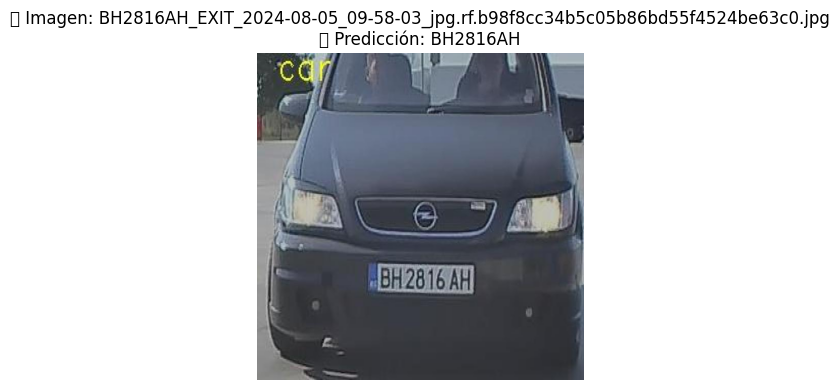

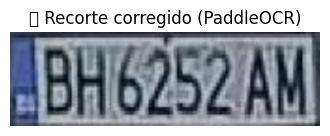

[2025/05/01 22:29:02] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04208803176879883
[2025/05/01 22:29:02] ppocr DEBUG: cls num  : 1, elapsed : 0.011402130126953125
[2025/05/01 22:29:02] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0817265510559082


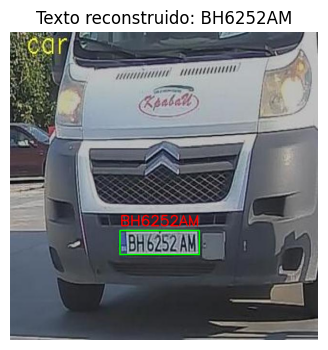

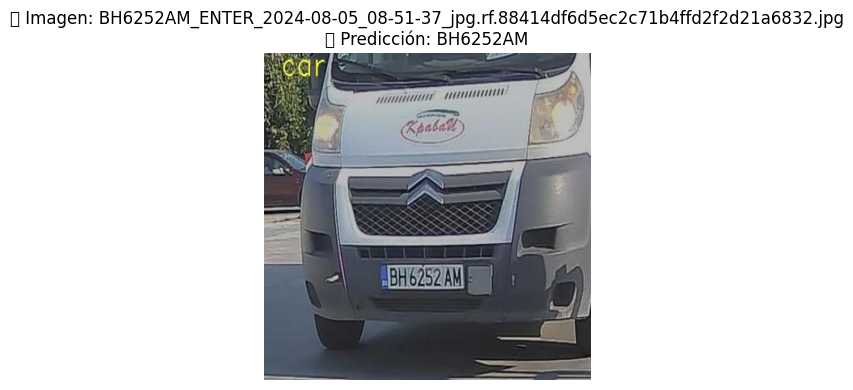

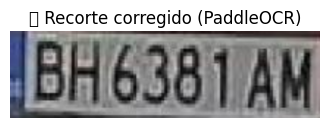

[2025/05/01 22:29:02] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03982686996459961
[2025/05/01 22:29:02] ppocr DEBUG: cls num  : 1, elapsed : 0.011058807373046875
[2025/05/01 22:29:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08293533325195312


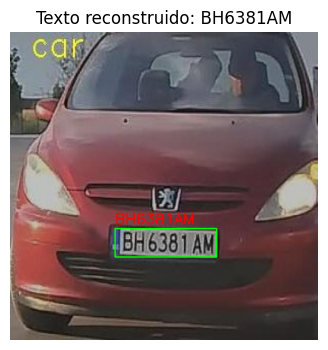

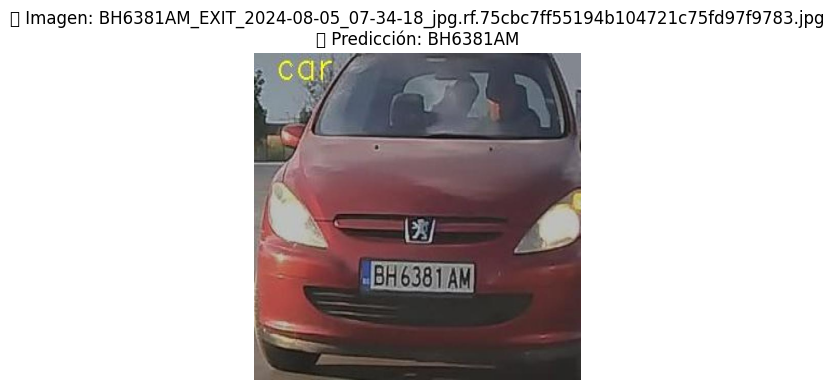

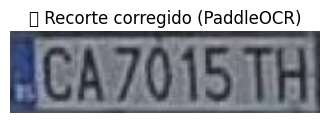

[2025/05/01 22:29:03] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027043581008911133
[2025/05/01 22:29:03] ppocr DEBUG: cls num  : 1, elapsed : 0.010499238967895508
[2025/05/01 22:29:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08048892021179199


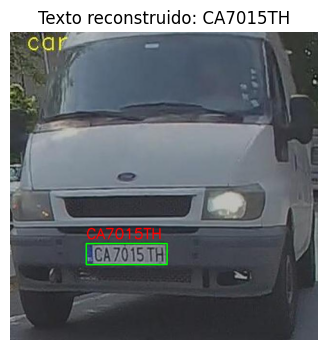

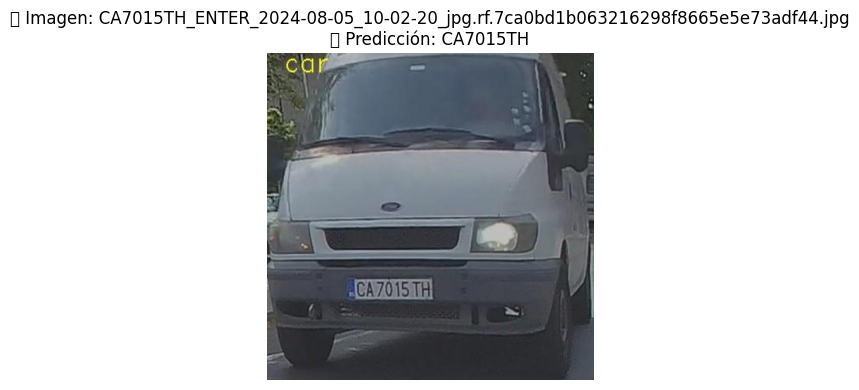

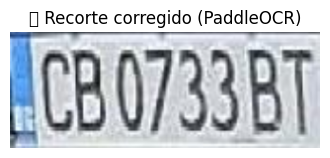

[2025/05/01 22:29:04] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.031193017959594727
[2025/05/01 22:29:04] ppocr DEBUG: cls num  : 1, elapsed : 0.010063648223876953
[2025/05/01 22:29:04] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0899350643157959


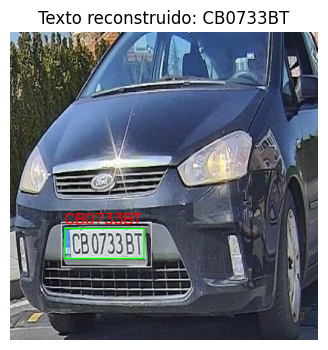

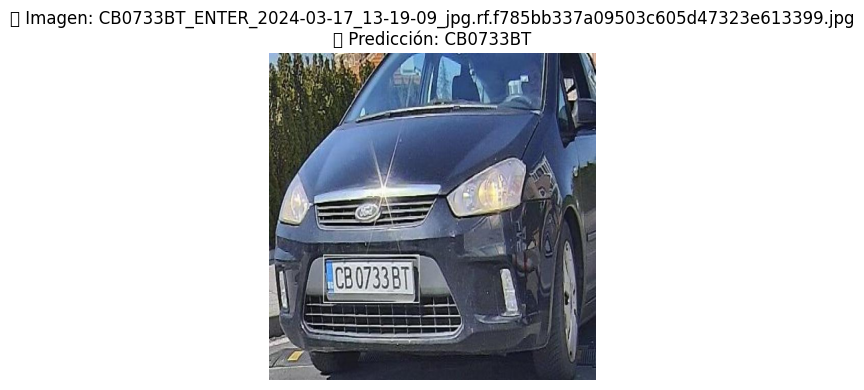

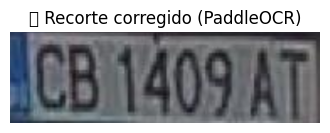

[2025/05/01 22:29:04] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.043148040771484375
[2025/05/01 22:29:04] ppocr DEBUG: cls num  : 1, elapsed : 0.018271923065185547
[2025/05/01 22:29:05] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09984350204467773


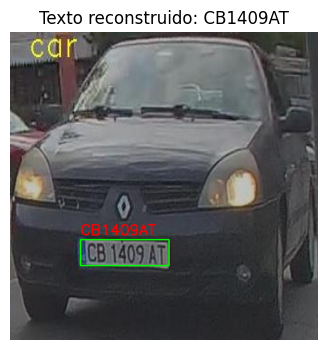

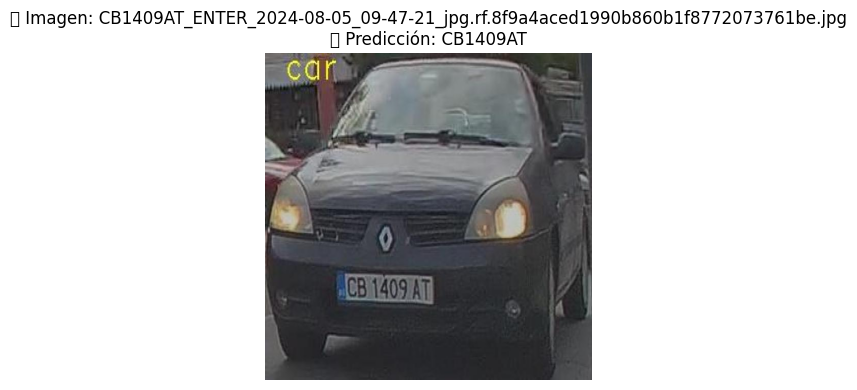

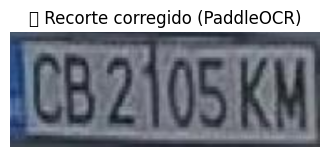

[2025/05/01 22:29:05] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.050460100173950195
[2025/05/01 22:29:05] ppocr DEBUG: cls num  : 1, elapsed : 0.019043684005737305
[2025/05/01 22:29:05] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09903860092163086


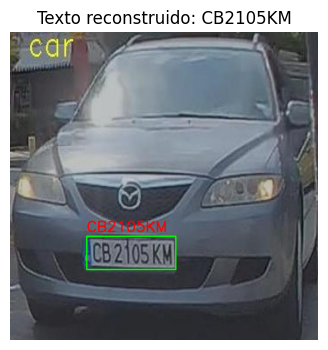

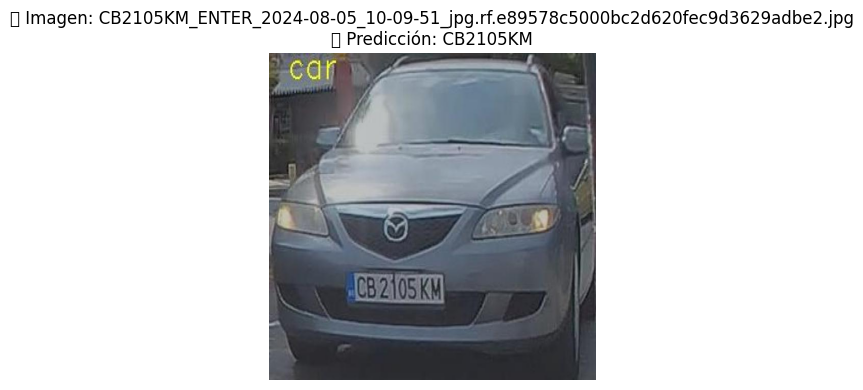

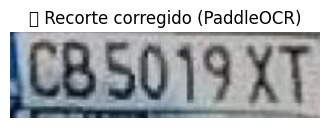

[2025/05/01 22:29:06] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.044985055923461914
[2025/05/01 22:29:06] ppocr DEBUG: cls num  : 1, elapsed : 0.01717853546142578
[2025/05/01 22:29:06] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09728288650512695


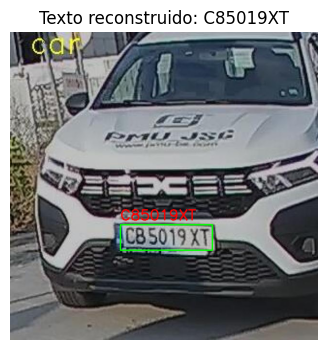

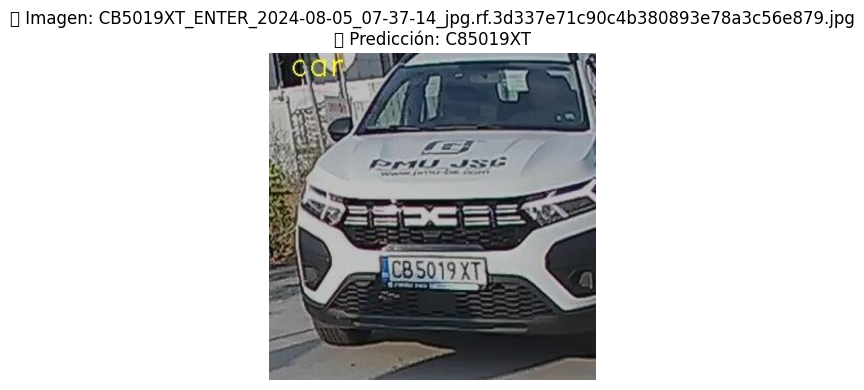

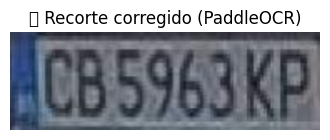

[2025/05/01 22:29:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03480982780456543
[2025/05/01 22:29:07] ppocr DEBUG: cls num  : 1, elapsed : 0.011354923248291016
[2025/05/01 22:29:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07940459251403809


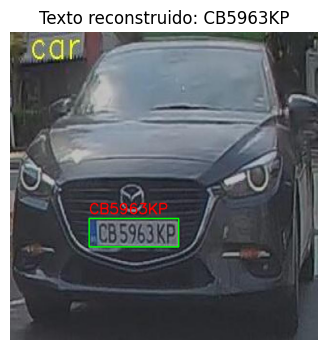

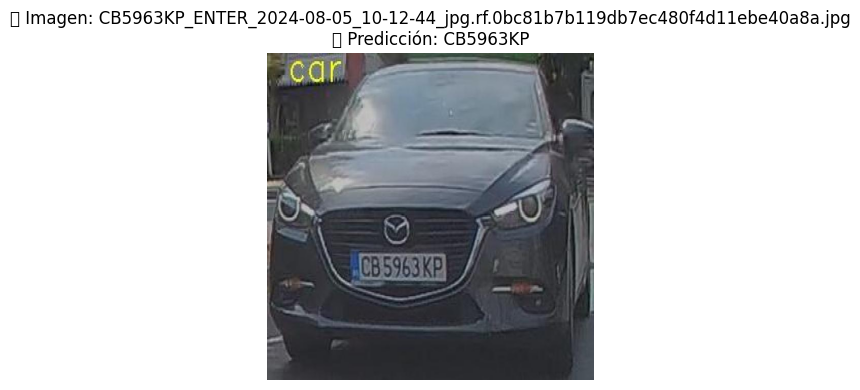

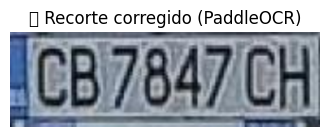

[2025/05/01 22:29:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03847837448120117
[2025/05/01 22:29:07] ppocr DEBUG: cls num  : 1, elapsed : 0.011296272277832031
[2025/05/01 22:29:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08202219009399414


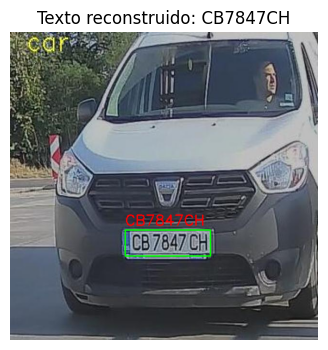

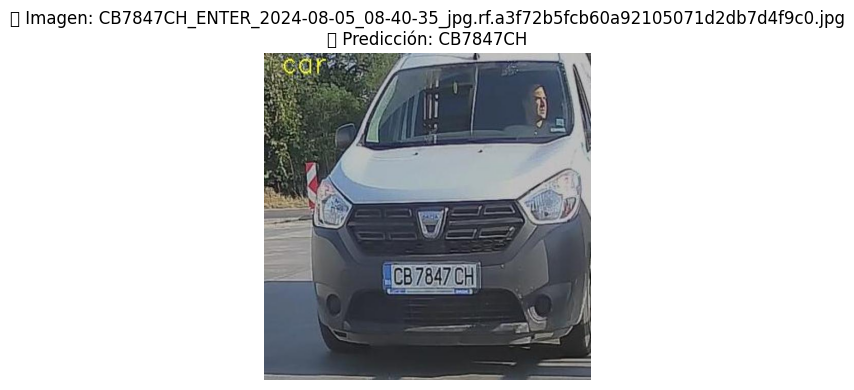

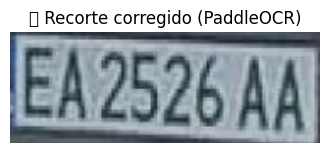

[2025/05/01 22:29:08] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03313183784484863
[2025/05/01 22:29:08] ppocr DEBUG: cls num  : 1, elapsed : 0.009850502014160156
[2025/05/01 22:29:08] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07801151275634766


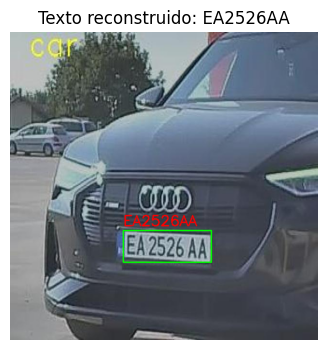

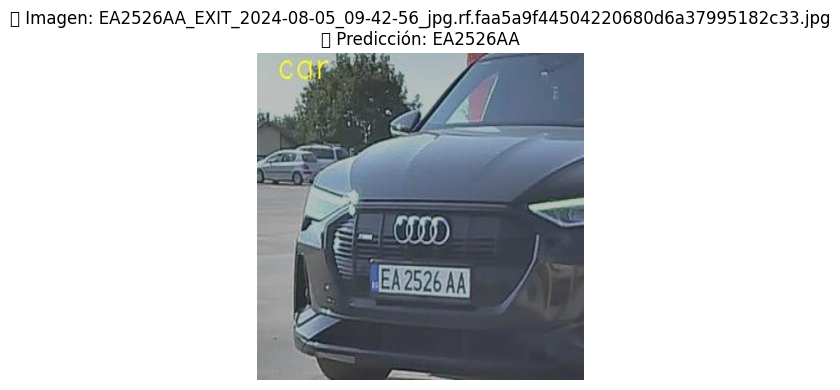

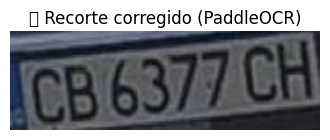

[2025/05/01 22:29:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03519392013549805
[2025/05/01 22:29:09] ppocr DEBUG: cls num  : 1, elapsed : 0.009881734848022461
[2025/05/01 22:29:09] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07840895652770996


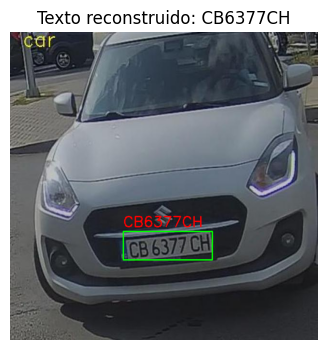

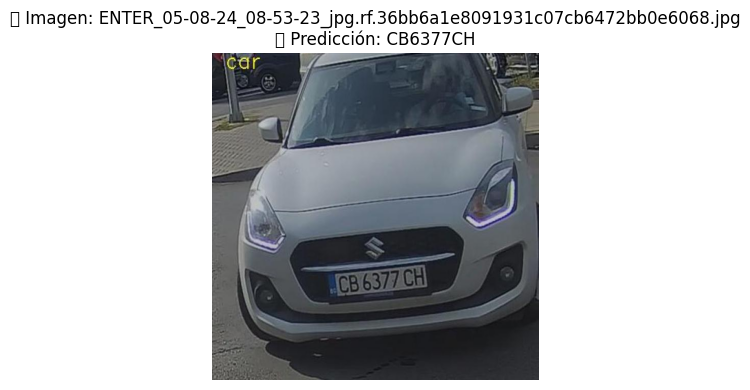

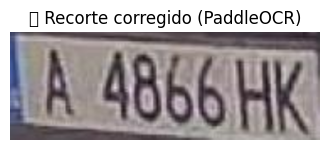

[2025/05/01 22:29:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0349428653717041
[2025/05/01 22:29:09] ppocr DEBUG: cls num  : 1, elapsed : 0.010279417037963867
[2025/05/01 22:29:09] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07728815078735352


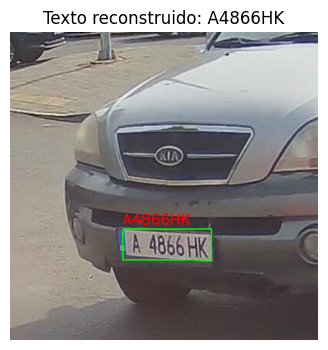

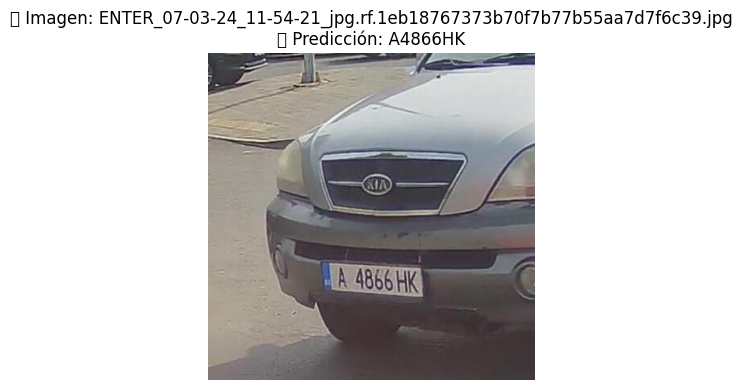

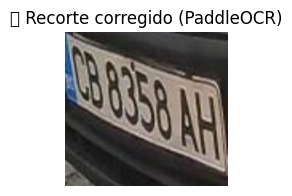

[2025/05/01 22:29:10] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03602719306945801
[2025/05/01 22:29:10] ppocr DEBUG: cls num  : 1, elapsed : 0.012572050094604492
[2025/05/01 22:29:10] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08258175849914551


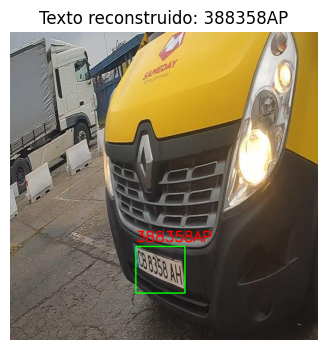

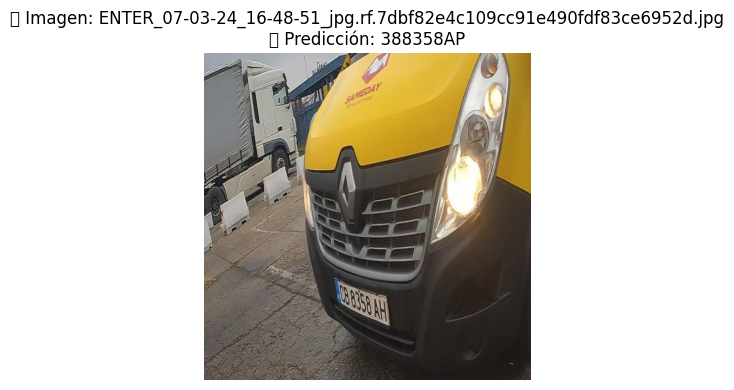

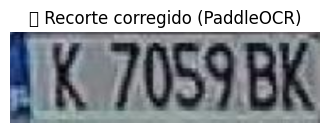

[2025/05/01 22:29:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04871559143066406
[2025/05/01 22:29:11] ppocr DEBUG: cls num  : 1, elapsed : 0.013762712478637695
[2025/05/01 22:29:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08654594421386719


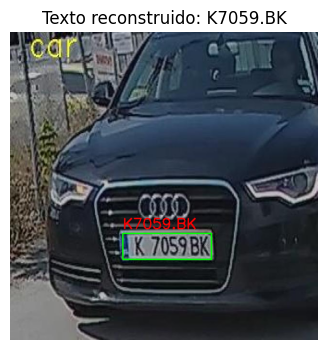

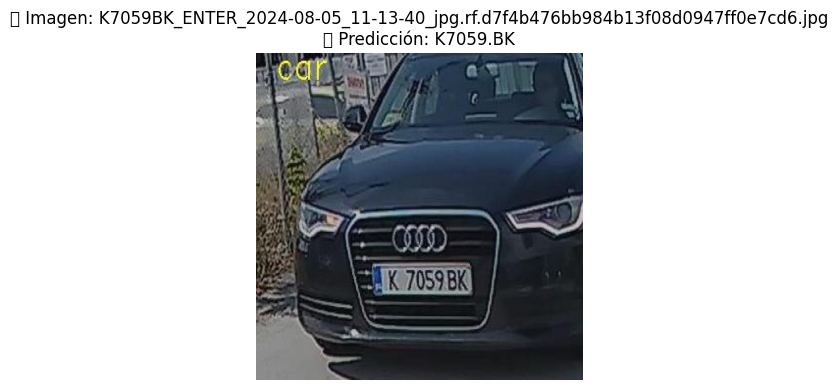

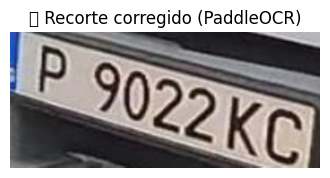

[2025/05/01 22:29:12] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.049895524978637695
[2025/05/01 22:29:12] ppocr DEBUG: cls num  : 1, elapsed : 0.020866870880126953
[2025/05/01 22:29:12] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10747957229614258


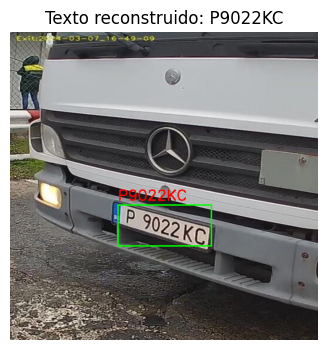

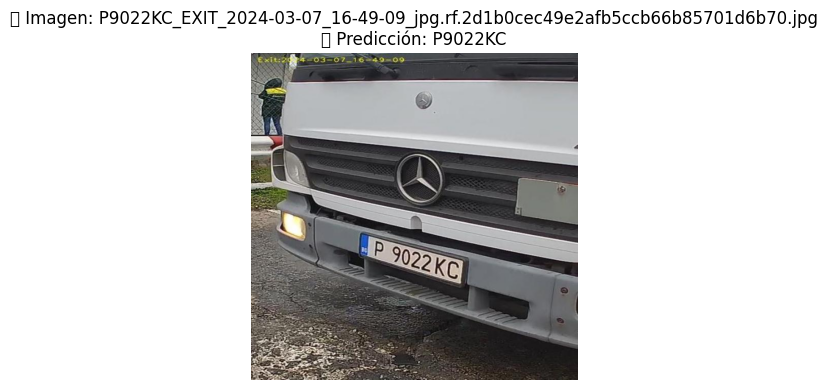

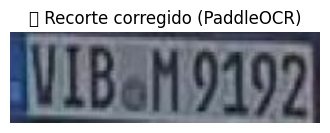

[2025/05/01 22:29:12] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03277707099914551
[2025/05/01 22:29:12] ppocr DEBUG: cls num  : 1, elapsed : 0.011541128158569336
[2025/05/01 22:29:12] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08753085136413574


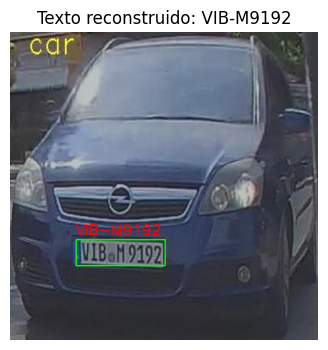

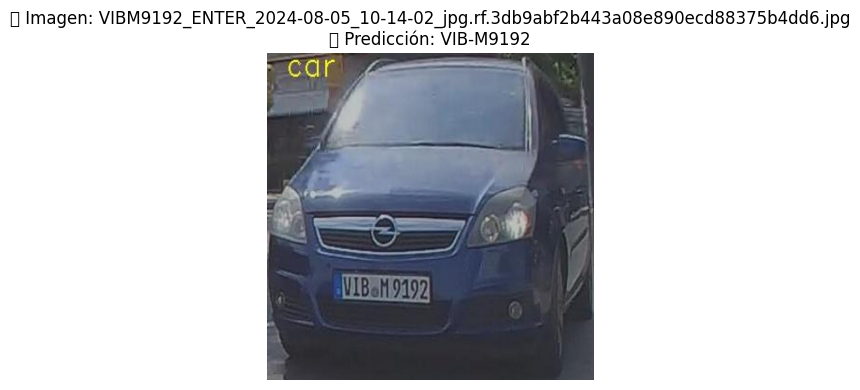

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# Directory containing the test images
carpeta_test = Path("/content/car_plate_dataset/camara_parking/Custom Workflow Object Detection/test/images")
imagenes = sorted(carpeta_test.glob("*.jpg"))  # Sort alphabetically for consistency

# List to store the results (file name, predicted text)
resultados = []

# Iterate over the test images
for ruta_imagen in imagenes:
    imagen = cv2.imread(str(ruta_imagen))

    if imagen is None:
        print(f"Invalid image: {ruta_imagen.name}")
        continue

    # Recognize the license plate using the full pipeline (detection + OCR)
    pred = reconocer_matricula_inteligente(imagen)

    # Store the result
    resultados.append((ruta_imagen.name, pred))

    # Display the image with the recognized text
    fig, axs = plt.subplots(1, 1, figsize=(6, 4))
    axs.imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
    axs.set_title(f"Image: {ruta_imagen.name}\nPrediction: {pred}")
    axs.axis("off")
    plt.tight_layout()
    plt.show()

Evaluate the Metrics


In [ ]:
import re
import pandas as pd

# Dictionary of special cases: partial filename → known correct license plate
matriculas_enter = {
    "ENTER_05-08-24_08-53-23": "CB6377CH",
    "ENTER_07-03-24_11-54-21": "A4866HK",
    "ENTER_07-03-24_16-48-51": "CB8358AH"
}

def extraer_ground_truth(nombre_archivo):
    """
    Extracts the real license plate from the filename.
    If the name contains a known key, the corresponding value is returned.
    Otherwise, attempts to extract an alphanumeric sequence as the license plate.
    """
    nombre_mayus = nombre_archivo.upper()

    for clave, valor in matriculas_enter.items():
        if clave in nombre_mayus:
            return valor

    match = re.search(r"[A-Z0-9]{5,}", nombre_mayus)
    return match.group(0) if match else ""

def limpiar_prediccion(texto):
    """
    Cleans the OCR prediction by keeping only uppercase alphanumeric characters.
    """
    texto = str(texto).upper()
    return re.sub(r"[^A-Z0-9]", "", texto)

def acierto_por_caracter(real, pred):
    """
    Calculates the percentage of correctly recognized characters (only if lengths match).
    """
    if len(real) != len(pred):
        return 0
    return sum(r == p for r, p in zip(real, pred)) / len(real)

# Create DataFrame from the list of results [(filename, predicted_text)]
df = pd.DataFrame(resultados, columns=["archivo", "matricula_detectada"])

# Process each row
df["real"] = df["archivo"].apply(extraer_ground_truth)            # Expected ground truth
df["pred"] = df["matricula_detectada"].apply(limpiar_prediccion)  # Cleaned prediction
df["acierto_exacto"] = df["real"] == df["pred"]                   # Exact match comparison
df["similitud_caracter"] = [
    acierto_por_caracter(r, p) for r, p in zip(df["real"], df["pred"])
]

# Calculate global metrics
accuracy_total = df["acierto_exacto"].mean()
media_similitud = df["similitud_caracter"].mean()

# Display metrics
print("OCR METRICS")
print(f"Exact matches: {accuracy_total:.2%}")
print(f"Average character accuracy: {media_similitud:.2%}")

# Show detailed results per image
print("\nResults per image:")
print(df[["archivo", "real", "pred", "acierto_exacto", "similitud_caracter"]])

📊 MÉTRICAS OCR
✅ Aciertos exactos: 86.96%
🧠 Precisión media por carácter: 93.48%

📋 Resultados completos:
                                              archivo      real       pred  \
0   A0065HB_EXIT_2024-08-05_09-46-41_jpg.rf.6d7904...   A0065HB    A0065HB   
1   A3731PA_EXIT_2024-08-05_10-16-27_jpg.rf.2335f8...   A3731PA    A3731PA   
2   A4205MX_EXIT_2024-08-05_09-51-37_jpg.rf.e3edb8...   A4205MX    A4205MX   
3   A5522MA_EXIT_2024-03-17_13-05-44_jpg.rf.e8363e...   A5522MA  B6A5522MA   
4   A7587HX_ENTER_2024-03-17_12-56-20_jpg.rf.dfd5e...   A7587HX    A7587HX   
5   A9775MK_EXIT_2024-08-05_10-26-35_jpg.rf.b9780c...   A9775MK    A9775MK   
6   BH2816AH_EXIT_2024-08-05_09-58-03_jpg.rf.b98f8...  BH2816AH   BH2816AH   
7   BH6252AM_ENTER_2024-08-05_08-51-37_jpg.rf.8841...  BH6252AM   BH6252AM   
8   BH6381AM_EXIT_2024-08-05_07-34-18_jpg.rf.75cbc...  BH6381AM   BH6381AM   
9   CA7015TH_ENTER_2024-08-05_10-02-20_jpg.rf.7ca0...  CA7015TH   CA7015TH   
10  CB0733BT_ENTER_2024-03-17_13-19-

## 🧠 6. Final Reflection

The application of the YOLO model along with the adjustment of zoom and orientation of license plates is key for the OCR model to correctly recognize the characters.

The final model performs quite well, although it fails on 3 images.  
Among those, at least one has a strongly skewed perspective that may confuse the model. Performance could be further improved by applying a model capable of enhancing image resolution and another for correcting perspective to center the plate even more precisely. However, the computational cost of each recognition would increase significantly.